# structural attributes of phishing Websites Lennart Zipfel INB-3
Dataset [https://archive.ics.uci.edu/dataset/327/phishing+websites]

# prepare Dataset

In [ ]:
import pandas as pd
from ucimlrepo import fetch_ucirepo
#identify repo via repo id
phishing_data = fetch_ucirepo(id=327)
X = phishing_data.data.features
y = phishing_data.data.targets
#create panda dataframe
df = pd.concat([X, y], axis=1)
csv_path = "phishing_websites.csv"
df.to_csv(csv_path, index=False)

print(f" Data : {csv_path}")


Lade
 Datensatz : phishing_websites.csv


# Basic exploration of the phishingdatenset

# read csv

In [7]:
# notebook_1_data_loading.ipynb

# 1. Bibliotheken importieren
import pandas as pd

# 2. CSV einlesen und NA-Werte behandeln
df = pd.read_csv("phishing_websites.csv")
df = df.fillna("unknown")

# 3. Übersicht über das DataFrame
print("Shape:", df.shape)
display(df.head())
df.info()
display(df.describe(include='all'))


Shape: (11055, 31)


,having_ip_address,url_length,shortining_service,having_at_symbol,double_slash_redirecting,prefix_suffix,having_sub_domain,sslfinal_state,domain_registration_length,favicon,...,popupwindow,iframe,age_of_domain,dnsrecord,web_traffic,page_rank,google_index,links_pointing_to_page,statistical_report,result
0,-1,1,1,1,-1,-1,-1,-1,-1,1,...,1,1,-1,-1,-1,-1,1,1,-1,-1
1,1,1,1,1,1,-1,0,1,-1,1,...,1,1,-1,-1,0,-1,1,1,1,-1
2,1,0,1,1,1,-1,-1,-1,-1,1,...,1,1,1,-1,1,-1,1,0,-1,-1
3,1,0,1,1,1,-1,-1,-1,1,1,...,1,1,-1,-1,1,-1,1,-1,1,-1
4,1,0,-1,1,1,-1,1,1,-1,1,...,-1,1,-1,-1,0,-1,1,1,1,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11055 entries, 0 to 11054
Data columns (total 31 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   having_ip_address           11055 non-null  int64
 1   url_length                  11055 non-null  int64
 2   shortining_service          11055 non-null  int64
 3   having_at_symbol            11055 non-null  int64
 4   double_slash_redirecting    11055 non-null  int64
 5   prefix_suffix               11055 non-null  int64
 6   having_sub_domain           11055 non-null  int64
 7   sslfinal_state              11055 non-null  int64
 8   domain_registration_length  11055 non-null  int64
 9   favicon                     11055 non-null  int64
 10  port                        11055 non-null  int64
 11  https_token                 11055 non-null  int64
 12  request_url                 11055 non-null  int64
 13  url_of_anchor               11055 non-null  int64
 14  links_

,having_ip_address,url_length,shortining_service,having_at_symbol,double_slash_redirecting,prefix_suffix,having_sub_domain,sslfinal_state,domain_registration_length,favicon,...,popupwindow,iframe,age_of_domain,dnsrecord,web_traffic,page_rank,google_index,links_pointing_to_page,statistical_report,result
count,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,...,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000
mean,0.313795,-0.633198,0.738761,0.700588,0.741474,-0.734962,0.063953,0.250927,-0.336771,0.628584,...,0.613388,0.816915,0.061239,0.377114,0.287291,-0.483673,0.721574,0.344007,0.719584,0.113885
std,0.949534,0.766095,0.673998,0.713598,0.671011,0.678139,0.817518,0.911892,0.941629,0.777777,...,0.789818,0.576784,0.998168,0.926209,0.827733,0.875289,0.692369,0.569944,0.694437,0.993539
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,-1.000000,-1.000000,1.000000,1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1.000000,...,1.000000,1.000000,-1.000000,-1.000000,0.000000,-1.000000,1.000000,0.000000,1.000000,-1.000000
50%,1.000000,-1.000000,1.000000,1.000000,1.000000,-1.000000,0.000000,1.000000,-1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,-1.000000,1.000000,0.000000,1.000000,1.000000
75%,1.000000,-1.000000,1.000000,1.000000,1.000000,-1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# data distribution

Target column: result

Target distribution ([-1, 1]):
 result
-1    4898
 1    6157
Name: count, dtype: int64


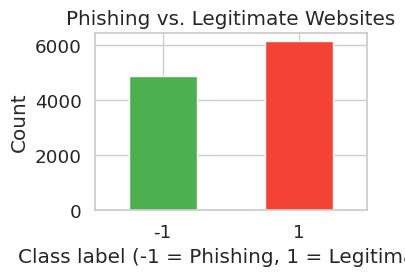

In [ ]:
# notebook_2_target_overview.ipynb

import pandas as pd
import matplotlib.pyplot as plt

# 1. Daten importieren (bereits vorverarbeitet)
df = pd.read_csv("phishing_websites.csv").fillna("unknown")

# 2. Zielspalte definieren und verteilen
target_col = "result"
print("Target column:", target_col)

class_counts = df[target_col].value_counts().sort_index()
print(f"\nTarget distribution ({class_counts.index.tolist()}):\n", class_counts)

# 3. Balkendiagramm der Klassenverteilung
plt.figure(figsize=(4, 3))
class_counts.plot(
    kind='bar',
    color=['#4CAF50', '#F44336']
)
plt.title('Phishing vs. Legitimate Websites')
plt.xlabel('Class label (-1 = Phishing, 1 = Legitimate)')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


# feature analysis

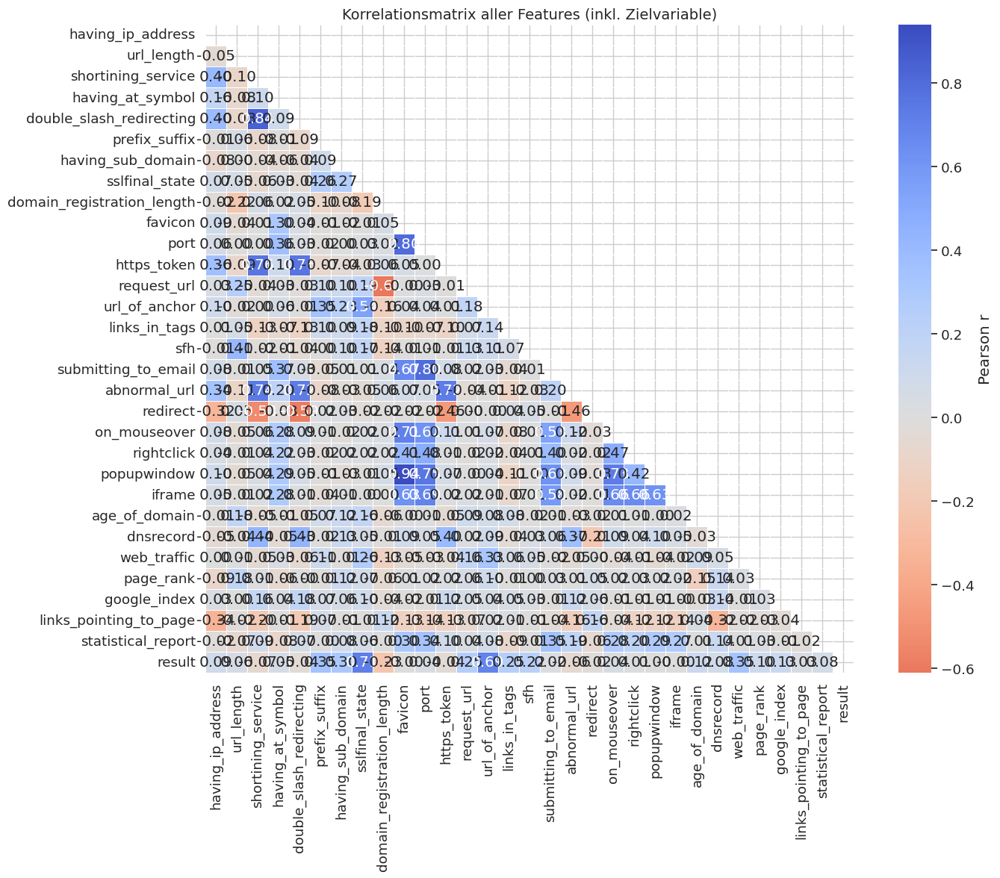

In [9]:
# notebook_3_feature_correlation.ipynb

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Daten laden
df = pd.read_csv("phishing_websites.csv").fillna("unknown")

# 2. Korrelationsmatrix berechnen
#    Dafür müssen alle Spalten numerisch sein:
corr = df.astype("float").corr(method="pearson")

# 3. Maske für die obere Dreiecksmatrix
mask = np.triu(np.ones_like(corr, dtype=bool))

# 4. Plot
plt.figure(figsize=(15, 12))
sns.set(font_scale=1.2)
sns.set_style("whitegrid")
sns.heatmap(
    corr,
    mask=mask,
    cmap="coolwarm_r",
    center=0,
    square=True,
    linewidths=0.5,
    annot=True,
    fmt=".2f",
    cbar_kws={'label': 'Pearson r'}
)
plt.title("Korrelationsmatrix aller Features (inkl. Zielvariable)", fontsize=14)
plt.tight_layout()
plt.show()


# create RDF

In [25]:

from rdflib import Graph


ontology_path = "onto.ttl"
data_path = "fertig.ttl"
output_path = "06.05.ttl"


g = Graph()
g.parse(ontology_path, format="turtle")
g.parse(data_path, format="turtle")


g.serialize(destination=output_path, format="turtle")

print(f"RDF-Datei gespeichert als: {output_path}")


RDF-Datei gespeichert als: 06.05.ttl


# Ontology from dataset
EX = Namespace("http://example.org/phishing#") iana Referenz

In [ ]:
from rdflib import Graph, Namespace, URIRef, Literal
from rdflib.namespace import RDF

# Bestehenden Graph laden
g = Graph()
g.parse("06.05.ttl", format="turtle")

# Namespace (wie in deiner Ontologie)
EX = Namespace("http://example.org/phishing#")
g.bind("ex", EX)

# SPARQL-Abfrage: Kategorie → Anzahl FeatureTypes
q = """
SELECT ?category (COUNT(?featureType) AS ?count)
WHERE {
  ?featureType a ex:FeatureType ;
               ex:hasCategory ?category .
}
GROUP BY ?category

"""

# Ergebnistripel erzeugen
for row in g.query(q):
    category_uri = row.category        
#    count = int(row.featureCount)       # Anzahl als Literal
    stat_node = URIRef(str(category_uri) + "_stat")

    g.add((stat_node, RDF.type, EX.FeatureCategoryStats))
    g.add((stat_node, EX.forCategory, category_uri))
   # g.add((stat_node, EX.featureCount, Literal(count)))


In [ ]:
import pandas as pd
from rdflib import Graph, Namespace, Literal, URIRef
from rdflib.namespace import RDF, RDFS, XSD

CSV_IN = "phishing_websites.csv"
ONTO_TTL = "onto.ttl"
TTL_DATA = "fertig.ttl"
TTL_OUT = "August.ttl"

EX = Namespace("http://example.org/phishing#")
g = Graph()
g.bind("ex", EX)
g.bind("rdfs", RDFS)

for val, label in [(-1, "-1 (suspicious)"), (0, "0 (neutral)"), (1, "1 (legitimate)")]:
    score_node = EX[f"ScoreValue_{val if val >= 0 else 'Minus1'}"] if val != 1 else EX.ScoreValue_One
    g.add((score_node, RDF.type, EX.FeatureValue))
    g.add((score_node, RDFS.label, Literal(label, datatype=XSD.string)))
    g.add((score_node, EX.score, Literal(val, datatype=XSD.integer)))


category_labels = {
    "URL_Features": "URL Features",
    "DNS_Features": "DNS Features",
    "Content_Features": "Content Features",
    "Statistical_Features": "Statistical Features",
}

for cat_id, label in category_labels.items():
    cat_uri = EX[cat_id]
    g.add((cat_uri, RDF.type, EX.FeatureCategory))
    g.add((cat_uri, RDFS.label, Literal(label, datatype=XSD.string)))


df = pd.read_csv(CSV_IN, low_memory=False).fillna("unknown").head(1000)
feature_columns = [col for col in df.columns if col != "result"]
column_to_category = {
    "having_ip_address": EX.URL_Features,
    "url_length": EX.URL_Features,
    "shortining_service": EX.URL_Features,
    "having_at_symbol": EX.URL_Features,
    "double_slash_redirecting": EX.URL_Features,
    "prefix_suffix": EX.URL_Features,
    "having_sub_domain": EX.URL_Features,
    "sslfinal_state": EX.URL_Features,
    "domain_registration_length": EX.URL_Features,
    "favicon": EX.URL_Features,
    "port": EX.URL_Features,
    "https_token": EX.URL_Features,
    "age_of_domain": EX.DNS_Features,
    "dnsrecord": EX.DNS_Features,
    "popupwindow": EX.Content_Features,
    "iframe": EX.Content_Features,
    "on_mouseover": EX.Content_Features,
    "rightclick": EX.Content_Features,
    "submitting_to_email": EX.Content_Features,
    "abnormal_url": EX.Content_Features,
    "redirect": EX.Content_Features,
    "web_traffic": EX.Statistical_Features,
    "page_rank": EX.Statistical_Features,
    "google_index": EX.Statistical_Features,
    "links_pointing_to_page": EX.Statistical_Features,
    "statistical_report": EX.Statistical_Features,
}

for col in feature_columns:
    ft_uri = EX[f"FeatureType_{col}"]
    g.add((ft_uri, RDF.type, EX.FeatureType))
    g.add((ft_uri, RDFS.label, Literal(col, datatype=XSD.string)))
    if col in column_to_category:
        g.add((ft_uri, EX.hasCategory, column_to_category[col]))

for idx, row in df.iterrows():
    site = EX[f"Website_{idx}"]
    g.add((site, RDF.type, EX.Website))
    g.add((site, RDF.type, EX.PhishingWebsite if int(row["result"]) == -1 else EX.LegitimateWebsite))
    g.add((site, RDFS.label, Literal(f"Website_{idx}", datatype=XSD.string)))

    for col in feature_columns:
        feat_inst = EX[f"Website_{idx}_Feature_{col}"]
        g.add((feat_inst, RDF.type, EX.Feature))
        g.add((feat_inst, RDFS.label, Literal(f"Feature_{col}_von_Website_{idx}", datatype=XSD.string)))
        g.add((feat_inst, EX.hasFeatureType, EX[f"FeatureType_{col}"]))
        g.add((feat_inst, EX.origin, Literal("CSV", datatype=XSD.string)))
        g.add((site, EX.hasFeature, feat_inst))

        try:
            val = int(row[col])
            score_uri = {
                -1: EX.ScoreValue_Minus1,
                0: EX.ScoreValue_Zero,
                1: EX.ScoreValue_One
            }.get(val, None)
            if score_uri:
                g.add((feat_inst, EX.hasValue, score_uri))
        except ValueError:
            raw_val = Literal(row[col], datatype=XSD.string)
            unknown_val = EX[f"FeatureValue_{idx}_{col}"]
            g.add((unknown_val, RDF.type, EX.FeatureValue))
            g.add((unknown_val, RDFS.label, Literal(f"UnknownValue_{col}_von_Website_{idx}", datatype=XSD.string)))
            g.add((unknown_val, EX.rawValue, raw_val))
            g.add((feat_inst, EX.hasValue, unknown_val))


g.serialize(destination=TTL_DATA, format="turtle")
print(" Instanzen gespeichert in", TTL_DATA)

g_final = Graph()
g_final.parse(ONTO_TTL, format="turtle")
g_final.parse(TTL_DATA, format="turtle")
g_final.serialize(destination=TTL_OUT, format="turtle")
print(g_final.serialize(format="turtle"))
print("Gesamtgraph gespeichert in", TTL_OUT)


 Instanzen gespeichert in fertig.ttl
@prefix ex: <http://example.org/phishing#> .
@prefix owl: <http://www.w3.org/2002/07/owl#> .
@prefix rdfs: <http://www.w3.org/2000/01/rdf-schema#> .
@prefix xsd: <http://www.w3.org/2001/XMLSchema#> .

ex:ScoreValue_0 a ex:FeatureValue ;
    rdfs:label "0 (neutral)"^^xsd:string ;
    ex:score 0 .

ex:Website_0 a ex:PhishingWebsite,
        ex:Website ;
    rdfs:label "Website_0",
        "Website_0"^^xsd:string ;
    ex:evaluationDate "2024-05-20T10:34:00"^^xsd:dateTime ;
    ex:hasFeature ex:Website_0_Feature_abnormal_url,
        ex:Website_0_Feature_age_of_domain,
        ex:Website_0_Feature_dnsrecord,
        ex:Website_0_Feature_domain_registration_length,
        ex:Website_0_Feature_double_slash_redirecting,
        ex:Website_0_Feature_favicon,
        ex:Website_0_Feature_google_index,
        ex:Website_0_Feature_having_at_symbol,
        ex:Website_0_Feature_having_ip_address,
        ex:Website_0_Feature_having_sub_domain,
        ex:Web

# SVM classification and comparison to spark query's


In [ ]:
# --- Self-contained: SVM train/test + Spark-Auswertung in EINEM Block ---

import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from pyspark.sql import SparkSession

# 1) Daten laden
df = pd.read_csv("phishing_websites.csv")
X = df.drop(columns=["result"])
# Remapping wie zuvor genutzt: -1 -> 1 (Phishing), 1 -> 0 (Legit)
y = df["result"].map({-1: 1, 1: 0}).astype(int)

# 2) Split + Modell
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)
svm = SVC(kernel="rbf", C=1.0, gamma="scale", random_state=42)
svm.fit(X_train, y_train)

# 3) Vorhersagen + Sklearn-Report
y_pred = svm.predict(X_test)
print("Vector based machine learning:")
print(classification_report(y_test, y_pred, target_names=["Legit", "Phishing"]))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

# Optional: CV zur Einordnung
scores = cross_val_score(svm, X, y, cv=5, scoring="accuracy")
print("5-Fold CV Accuracy: %.2f ± %.2f" % (scores.mean(), scores.std()))

# 4) Spark: PDF -> SDF
pdf = pd.DataFrame({
    "result": y_test.to_numpy(),        # 0=Legit, 1=Phishing
    "prediction": y_pred.astype(int)
})
spark = SparkSession.builder.appName("PhishingEvaluation").getOrCreate()
sdf = spark.createDataFrame(pdf)
sdf.createOrReplaceTempView("results")
print("spark query:")
# 5) Konfusionsmatrix (Spark)
spark.sql("""
  SELECT
    result AS label,
    prediction AS pred,
    COUNT(*) AS cnt
  FROM results
  GROUP BY result, prediction
  ORDER BY label, pred
""").show()

# 6) Accuracy (Spark, als Double)
spark.sql("""
  SELECT AVG(CASE WHEN result = prediction THEN 1.0 ELSE 0.0 END) AS accuracy
  FROM results
""").show()


              precision    recall  f1-score   support

       Legit       0.94      0.97      0.96      1231
    Phishing       0.96      0.93      0.94       980

    accuracy                           0.95      2211
   macro avg       0.95      0.95      0.95      2211
weighted avg       0.95      0.95      0.95      2211

Confusion Matrix:
 [[1192   39]
 [  72  908]]
5-Fold CV Accuracy: 0.94 ± 0.01


+-----+----+----+
|label|pred| cnt|
+-----+----+----+
|    0|   0|1192|
|    0|   1|  39|
|    1|   0|  72|
|    1|   1| 908|
+-----+----+----+

+--------+
|accuracy|
+--------+
| 0.94980|
+--------+

